In [ ]:
!pip install ucimlrepo -q


In [ ]:
!pip install -U imbalanced-learn -q


In [ ]:
!pip install scikit-optimize -q


     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 107.7/107.7 kB 1.4 MB/s eta 0:00:00


In [ ]:
import os
import joblib
import tempfile
from scipy.stats import zscore

import pandas as pd

from sklearn.model_selection import train_test_split


In [ ]:

import matplotlib.pyplot as plt
import seaborn as sns

#import sweetviz
#import pygwalker as pyg


In [ ]:
# A context object for caching a function’s return value each time it is called with the same input arguments.

# Specify the directory where cached results will be stored
# Use the system's temporary directory. This is useful if the cached data is intended to be temporary and can be regenerated.
cache_dir = tempfile.mkdtemp()
memory = joblib.Memory(location=cache_dir,
                verbose=0)

In [ ]:
from ucimlrepo import fetch_ucirepo

#@memory.cache
def fetch_dataset(id: int) -> pd.DataFrame:
    """
    The function is designed to retrieve a dataset with the specified ID
    from UCI and return the dataset, features, target respectively.
    """

    # fetch dataset
    dry_bean_dataset = fetch_ucirepo(id=602)

    # data (as pandas dataframes)
    X = dry_bean_dataset.data.features
    y = dry_bean_dataset.data.targets

    dry_beans = pd.concat(objs=[X, y],
                          axis=1
                          )

    return dry_beans, X, y

dry_beans, X, y = fetch_dataset(id=602)
dry_beans.head()

,Area,Perimeter,MajorAxisLength,MinorAxisLength,AspectRatio,Eccentricity,ConvexArea,EquivDiameter,Extent,Solidity,Roundness,Compactness,ShapeFactor1,ShapeFactor2,ShapeFactor3,ShapeFactor4,Class
0,28395,610.291,208.178117,173.888747,1.197191,0.549812,28715,190.141097,0.763923,0.988856,0.958027,0.913358,0.007332,0.003147,0.834222,0.998724,SEKER
1,28734,638.018,200.524796,182.734419,1.097356,0.411785,29172,191.272751,0.783968,0.984986,0.887034,0.953861,0.006979,0.003564,0.909851,0.998430,SEKER
2,29380,624.110,212.826130,175.931143,1.209713,0.562727,29690,193.410904,0.778113,0.989559,0.947849,0.908774,0.007244,0.003048,0.825871,0.999066,SEKER
3,30008,645.884,210.557999,182.516516,1.153638,0.498616,30724,195.467062,0.782681,0.976696,0.903936,0.928329,0.007017,0.003215,0.861794,0.994199,SEKER
4,30140,620.134,201.847882,190.279279,1.060798,0.333680,30417,195.896503,0.773098,0.990893,0.984877,0.970516,0.006697,0.003665,0.941900,0.999166,SEKER


In [ ]:
dry_beans['Area'].nunique()

12011

In [ ]:
dry_beans['Area'].drop_duplicates().shape

(12011,)

In [ ]:
# Check the number of duplicate in dry_beans

print(f'The number of duplicate rows = {dry_beans.duplicated().sum()}')


The number of duplicate rows = 68



"From the above code, $\color{blue}{\text{we observed that there are duplicate rows that need to be dropped.}}$ Keeping these duplicates would introduce bias and disproportionately increase the weight of a specific number of samples."

In [ ]:

# part from data preparation
# drop the duplicate rows

dry_beans.drop_duplicates(inplace=True)


In [ ]:
dry_beans.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 13543 entries, 0 to 13610
Data columns (total 17 columns):
 #   Column           Non-Null Count  Dtype  
---  ------           --------------  -----  
 0   Area             13543 non-null  int64  
 1   Perimeter        13543 non-null  float64
 2   MajorAxisLength  13543 non-null  float64
 3   MinorAxisLength  13543 non-null  float64
 4   AspectRatio      13543 non-null  float64
 5   Eccentricity     13543 non-null  float64
 6   ConvexArea       13543 non-null  int64  
 7   EquivDiameter    13543 non-null  float64
 8   Extent           13543 non-null  float64
 9   Solidity         13543 non-null  float64
 10  Roundness        13543 non-null  float64
 11  Compactness      13543 non-null  float64
 12  ShapeFactor1     13543 non-null  float64
 13  ShapeFactor2     13543 non-null  float64
 14  ShapeFactor3     13543 non-null  float64
 15  ShapeFactor4     13543 non-null  float64
 16  Class            13543 non-null  object 
dtypes: float64(1

all the columns type are numerical except the $\color{blue}{\text{class column which we need to encoder it}}$, If our models require that.

In [ ]:
dry_beans['Class'].value_counts()

DERMASON    3546
SIRA        2636
SEKER       2027
HOROZ       1860
CALI        1630
BARBUNYA    1322
BOMBAY       522
Name: Class, dtype: int64

from tha above code we could notice that there is $\color{blue}{\text{class imbalance}}$ abd we need to deal with as a part of data preprocessing, model building or in the evaluation step.


In [ ]:
dry_beans.describe()

,Area,Perimeter,MajorAxisLength,MinorAxisLength,AspectRatio,Eccentricity,ConvexArea,EquivDiameter,Extent,Solidity,Roundness,Compactness,ShapeFactor1,ShapeFactor2,ShapeFactor3,ShapeFactor4
count,13543.000000,13543.000000,13543.000000,13543.000000,13543.000000,13543.000000,13543.000000,13543.000000,13543.000000,13543.000000,13543.000000,13543.000000,13543.000000,13543.000000,13543.000000,13543.000000
mean,53048.460385,854.993406,319.895602,202.365321,1.581075,0.750315,53767.986709,253.034094,0.749829,0.987152,0.873671,0.800352,0.006561,0.001719,0.644341,0.995078
std,29392.438324,214.722684,85.809260,45.051632,0.245245,0.091858,29844.248525,59.307709,0.048939,0.004650,0.059393,0.061464,0.001130,0.000595,0.098653,0.004347
min,20420.000000,524.736000,183.601165,122.512653,1.024868,0.218951,20684.000000,161.243764,0.555315,0.919246,0.489618,0.640577,0.002778,0.000564,0.410339,0.947687
25%,36282.500000,703.230000,253.086806,175.886357,1.430662,0.715144,36673.000000,214.933277,0.718735,0.985678,0.833410,0.763228,0.005893,0.001158,0.582517,0.993720
50%,44580.000000,793.896000,296.404589,192.491117,1.549860,0.763997,45122.000000,238.245711,0.759903,0.988288,0.883490,0.801514,0.006643,0.001700,0.642424,0.996393
75%,61382.000000,977.146500,376.312489,217.245403,1.703916,0.809671,62360.000000,279.560351,0.786849,0.990019,0.917031,0.834470,0.007270,0.002173,0.696341,0.997891
max,254616.000000,1985.370000,738.860154,460.198497,2.430306,0.911423,263261.000000,569.374358,0.866195,0.994677,0.990685,0.987303,0.010451,0.003665,0.974767,0.999733


In the preceding code block, $\color{blue}{\text{it was observed that some columns exhibit skewness }}$ as evidenced by a notable difference between the mean and median values.

Also the $\color{blue}{\text{values in the columns are definitely in different ranges and need to be scaled }}$.

Finally from the min value for each column we notice that there's no negative values this help us decide which type of transform that we need to apply.

In [ ]:
# Check if there are any values equal to 0 in any column
zero_values_exist = (dry_beans == 0).any().any()

if zero_values_exist:
    print("There are values equal to 0 in at least one column.")
else:
    print("No values equal to 0 in any column.")

No values equal to 0 in any column.


The provided code reveals that our dataframe contains no zero values. As a result, we have the flexibility to employ various types of transformations, as all the values in the dataframe are positive.

In [ ]:
# To calculate the skewness which is a measure of the asymmetry of the distribution of values in a dataset.

#Calculate the skewness
skewness = dry_beans.skew()

# Define classification thresholds
NOT_SKEWED_THRESHOLD = 0.5
MILDLY_SKEWED_THRESHOLD = 1.0


# Classify columns based on skewness
skew_classification = pd.cut(x=skewness,
                        bins=[float('-inf'), -MILDLY_SKEWED_THRESHOLD, -NOT_SKEWED_THRESHOLD, NOT_SKEWED_THRESHOLD, MILDLY_SKEWED_THRESHOLD, float('inf')],
                        labels=['Highly Skewed', 'Mildly Skewed', 'Not Skewed', 'Mildly Skewed','Highly Skewed'],
                        ordered=False #ordered=False for duplicate labels
                        )

print(skew_classification[skew_classification == 'Highly Skewed'])

Area               Highly Skewed
Perimeter          Highly Skewed
MajorAxisLength    Highly Skewed
MinorAxisLength    Highly Skewed
Eccentricity       Highly Skewed
ConvexArea         Highly Skewed
EquivDiameter      Highly Skewed
Solidity           Highly Skewed
ShapeFactor4       Highly Skewed
dtype: category
Categories (3, object): ['Highly Skewed', 'Mildly Skewed', 'Not Skewed']


<ipython-input-45-8726946c388a>:4: FutureWarning: The default value of numeric_only in DataFrame.skew is deprecated. In a future version, it will default to False. In addition, specifying 'numeric_only=None' is deprecated. Select only valid columns or specify the value of numeric_only to silence this warning.
  skewness = dry_beans.skew()


There ars some columns that are highly skewed.

# $\color{purple}{\text{DATA VISUALIZATION}}$


In [ ]:
numerical_columns = dry_beans.select_dtypes(include="number")
categorical_columns = dry_beans.select_dtypes(include="object")

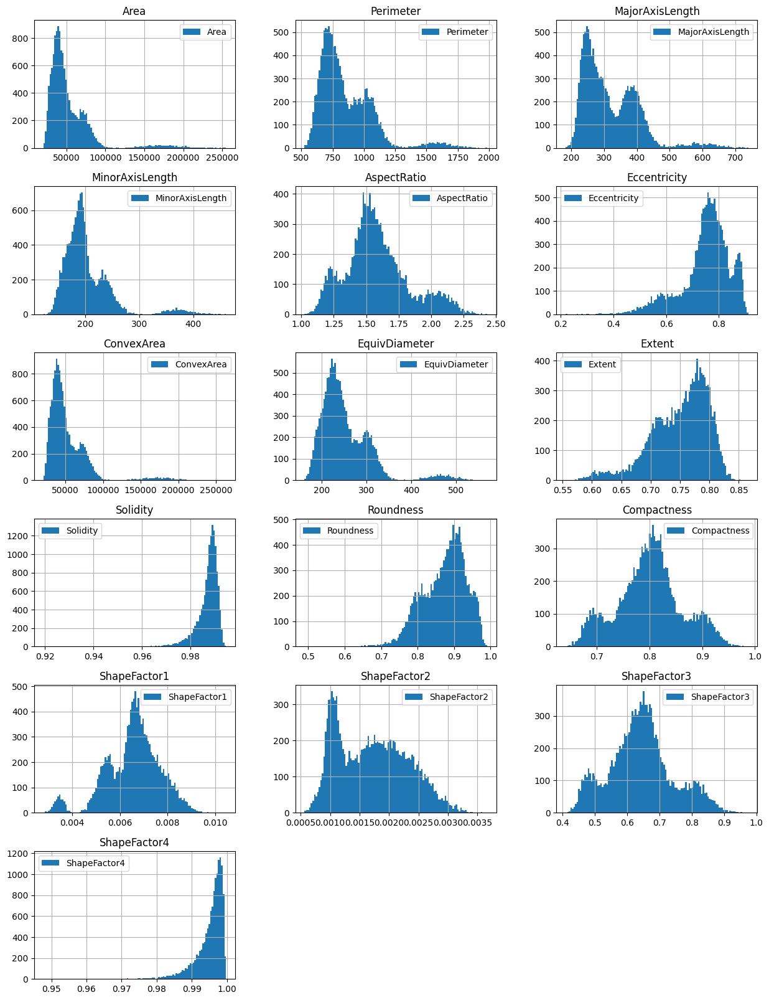

In [ ]:
# plot the histogram

# Check if the cached result is available
cache_file = f"dry_beans_hist_cache.pkl"
try:
    histogram_data = joblib.load(cache_file)
except FileNotFoundError:

    # If the cache file is not found, compute the histogram and save it

    # by practice the best number of bins to represent the data is the sqrt for num_rows
    num_bins = int(dry_beans.shape[0]**(1/2))

    histogram_data = dry_beans.hist(bins=num_bins,
                  layout=(6, 3),
                  legend=True ,
                  figsize=(15, 20)
                  )

    joblib.dump(histogram_data, cache_file)

plt.show()

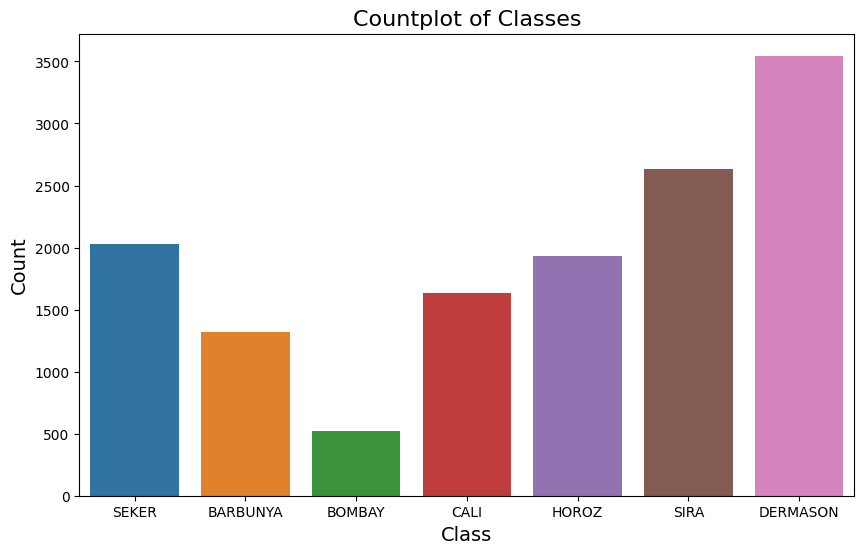

In [ ]:
# plot the countplot for the Class column

plt.figure(figsize=(10, 6))
sns.countplot(x=dry_beans['Class'])
plt.xlabel('Class', fontsize=14)
plt.ylabel('Count', fontsize=14)
plt.title('Countplot of Classes', fontsize=16)
plt.show()


<ipython-input-33-025209379059>:4: FutureWarning: The default value of numeric_only in DataFrame.corr is deprecated. In a future version, it will default to False. Select only valid columns or specify the value of numeric_only to silence this warning.
  sns.heatmap(data=dry_beans.corr(),


<Axes: >

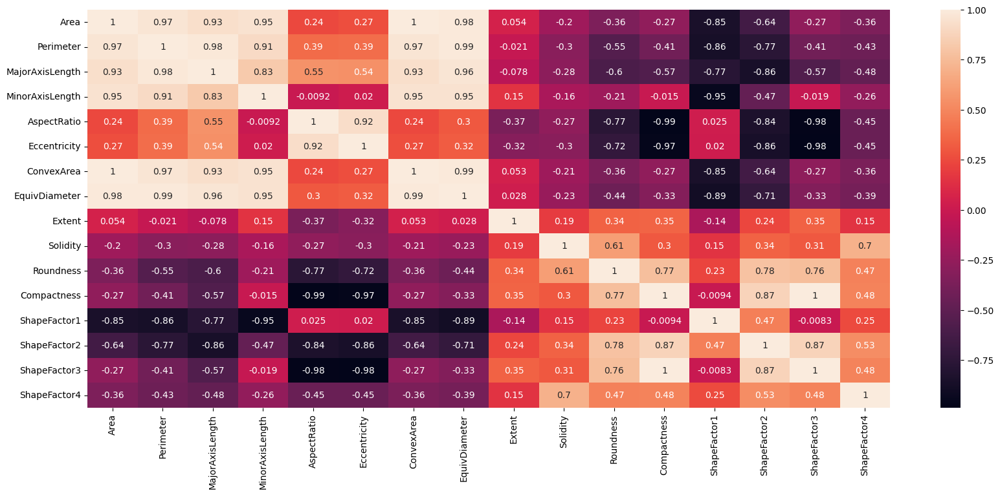

In [ ]:
# Check the correlation between columns

plt.figure(figsize=(20,8))
sns.heatmap(data=dry_beans.corr(),
            annot=True #write the data value in each cell.
            )

It's very obvious that we have introduced $\color{blue}{\text{multicollinearity problems}}$ , given the high correlation between columns. This correlation is evident, with some pairs of columns exhibiting a correlation coefficient reaching 1.

/usr/local/lib/python3.10/dist-packages/joblib/_store_backends.py:207: CacheWarning: Unable to cache to disk. Possibly a race condition in the creation of the directory. Exception: maximum recursion depth exceeded.
  warnings.warn(


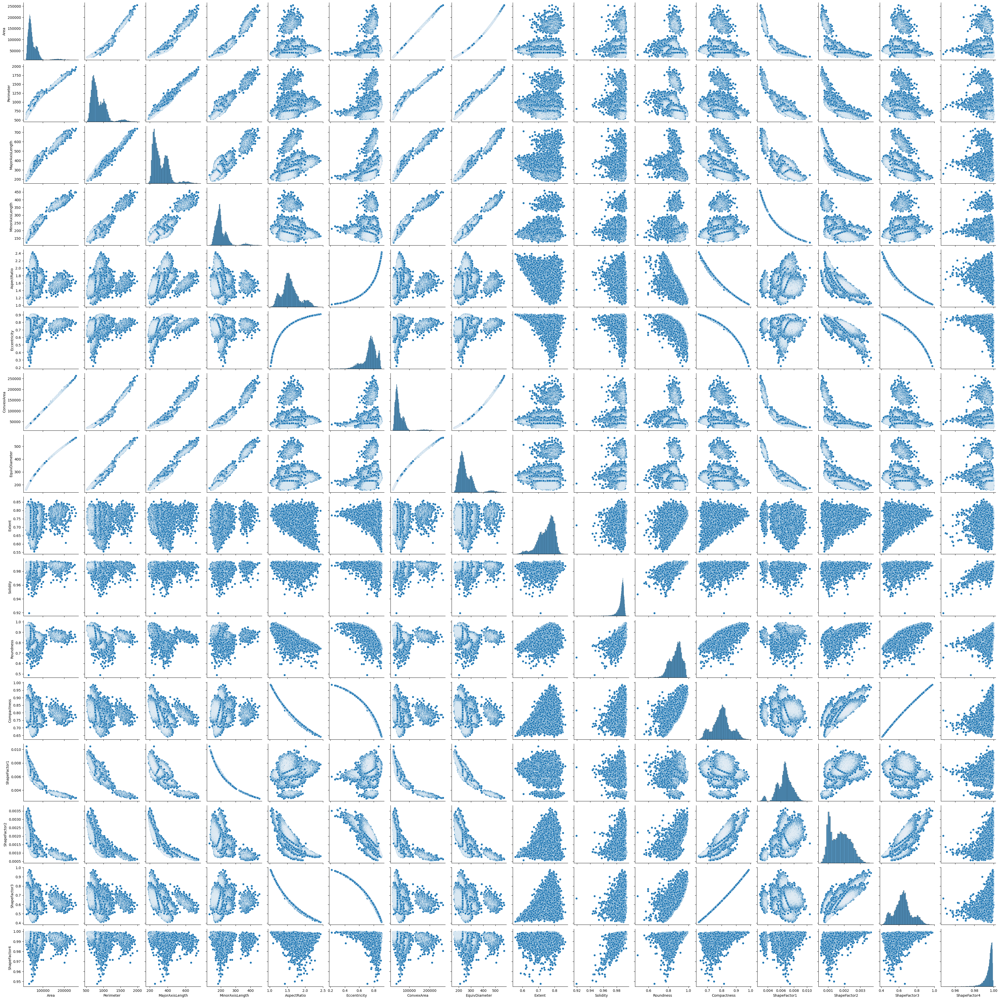

In [ ]:
sns.pairplot(dry_beans)


Wow, this scatter matrix is like nothing I've seen before. Yeah, it takes a bit to really see the shapes inside it. Some of them actually resemble beans, pretty cool!

From the above scatter matrix, we can observe that $\color{blue}{\text{some relationships are not linear}}$. For instance, between aspect ratio and eccentricity, the relationship appears to be exponential.


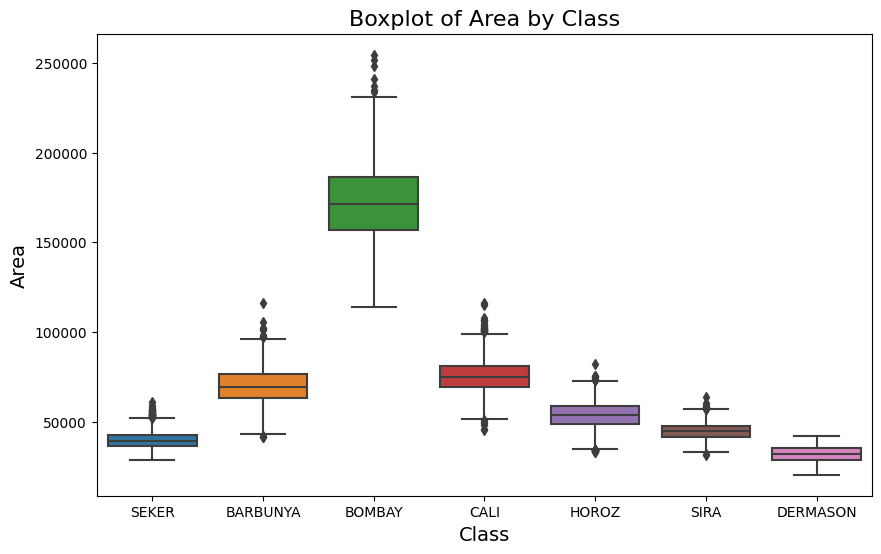

Total number of outliiers in Area = 122
{'Area': {'SEKER': 37, 'BARBUNYA': 12, 'BOMBAY': 7, 'CALI': 29, 'HOROZ': 23, 'SIRA': 14, 'DERMASON': 0}}


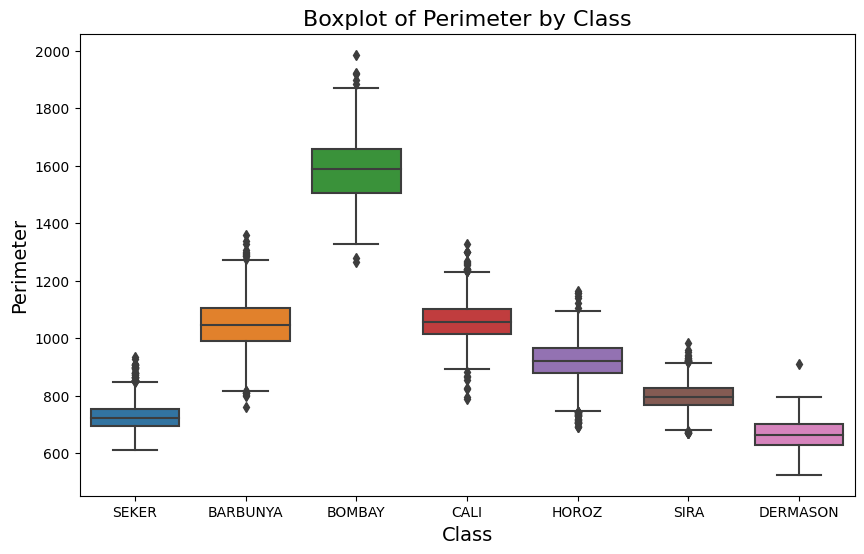

Total number of outliiers in Perimeter = 155
{'Perimeter': {'SEKER': 39, 'BARBUNYA': 20, 'BOMBAY': 7, 'CALI': 26, 'HOROZ': 37, 'SIRA': 25, 'DERMASON': 1}}


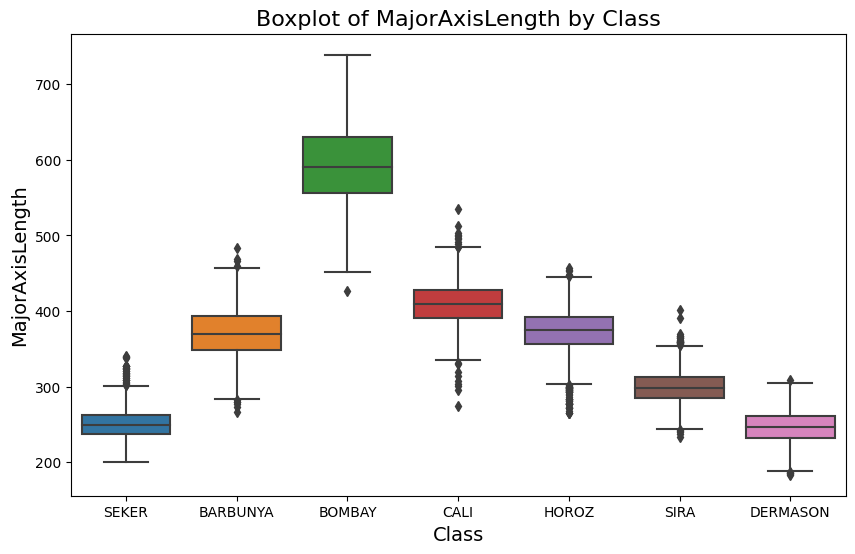

Total number of outliiers in MajorAxisLength = 144
{'MajorAxisLength': {'SEKER': 30, 'BARBUNYA': 10, 'BOMBAY': 1, 'CALI': 20, 'HOROZ': 52, 'SIRA': 25, 'DERMASON': 6}}


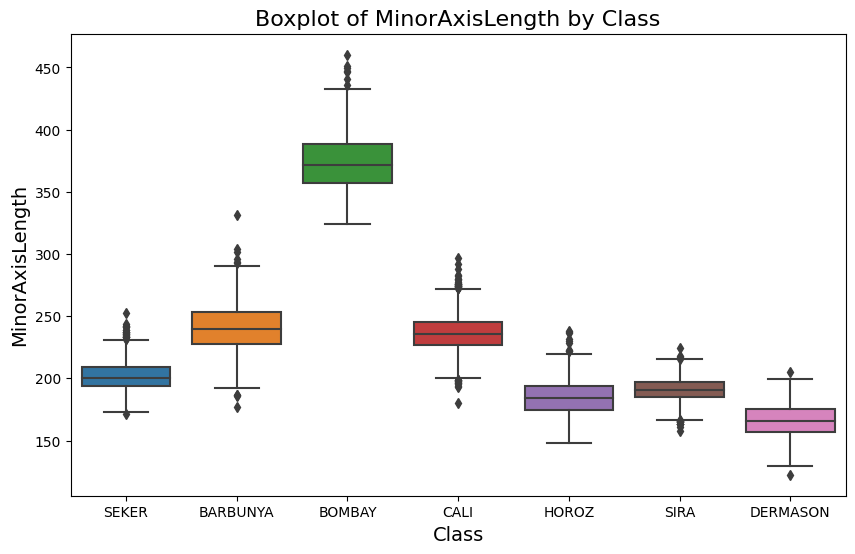

Total number of outliiers in MinorAxisLength = 107
{'MinorAxisLength': {'SEKER': 23, 'BARBUNYA': 10, 'BOMBAY': 7, 'CALI': 38, 'HOROZ': 9, 'SIRA': 18, 'DERMASON': 2}}


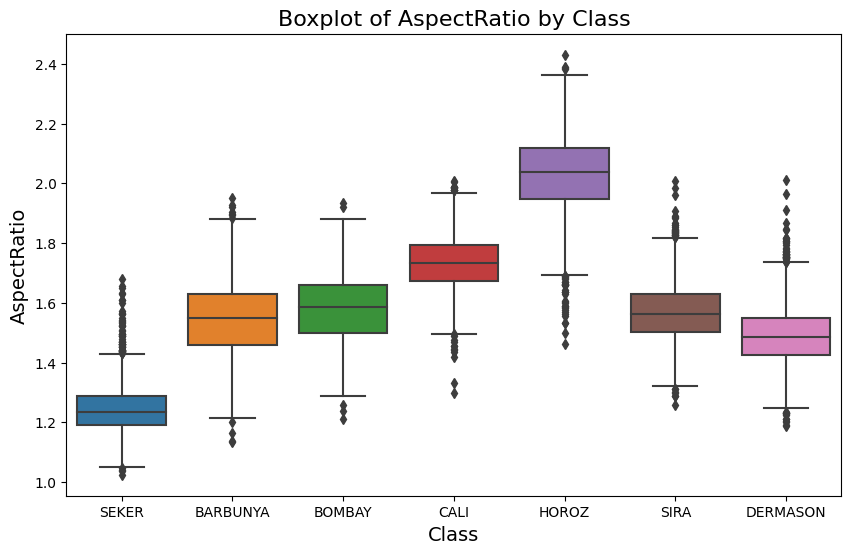

Total number of outliiers in AspectRatio = 221
{'AspectRatio': {'SEKER': 61, 'BARBUNYA': 11, 'BOMBAY': 5, 'CALI': 23, 'HOROZ': 36, 'SIRA': 34, 'DERMASON': 51}}


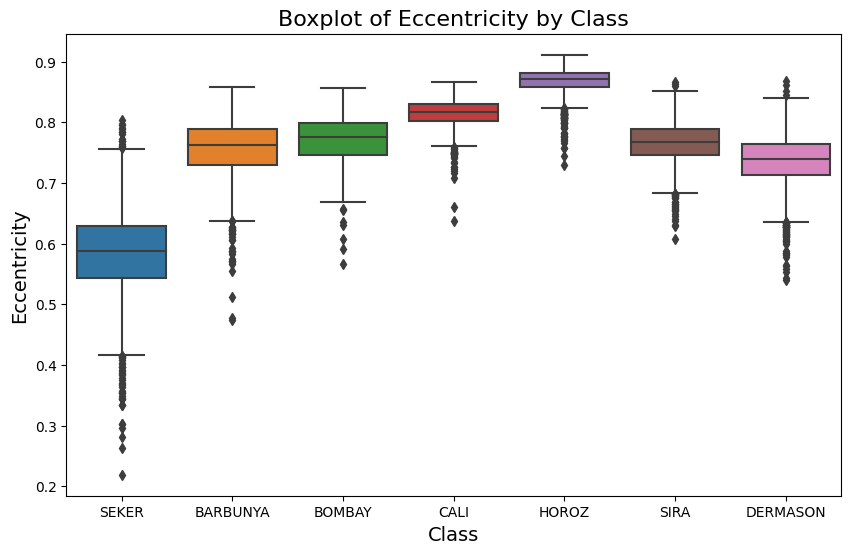

Total number of outliiers in Eccentricity = 280
{'Eccentricity': {'SEKER': 55, 'BARBUNYA': 31, 'BOMBAY': 7, 'CALI': 31, 'HOROZ': 67, 'SIRA': 32, 'DERMASON': 57}}


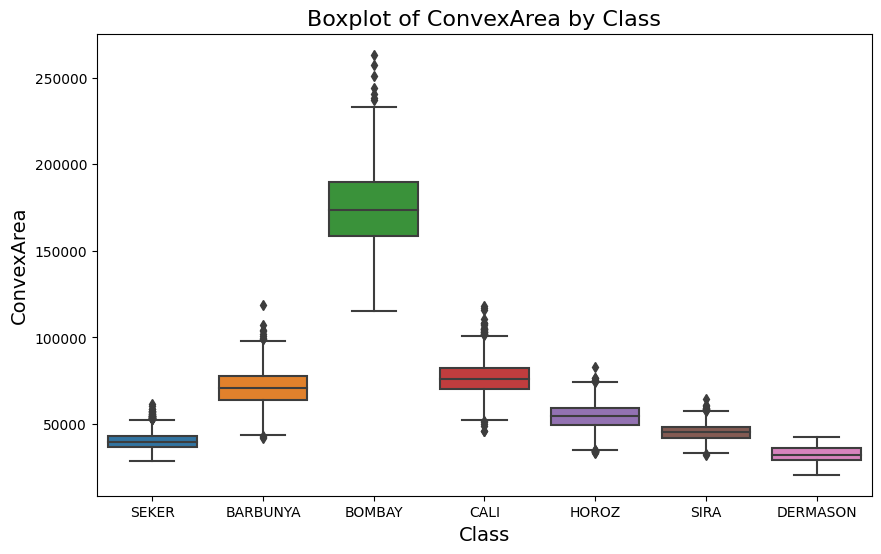

Total number of outliiers in ConvexArea = 119
{'ConvexArea': {'SEKER': 37, 'BARBUNYA': 12, 'BOMBAY': 7, 'CALI': 28, 'HOROZ': 21, 'SIRA': 14, 'DERMASON': 0}}


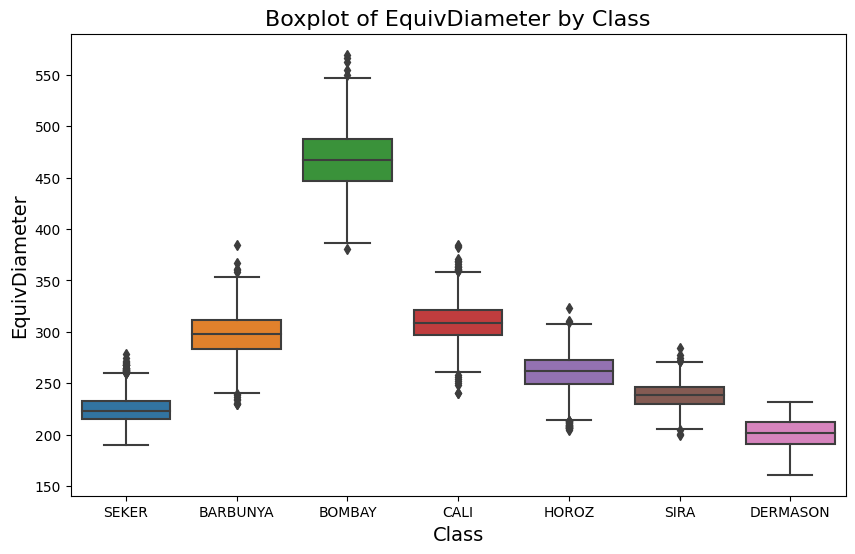

Total number of outliiers in EquivDiameter = 107
{'EquivDiameter': {'SEKER': 28, 'BARBUNYA': 13, 'BOMBAY': 6, 'CALI': 25, 'HOROZ': 26, 'SIRA': 9, 'DERMASON': 0}}


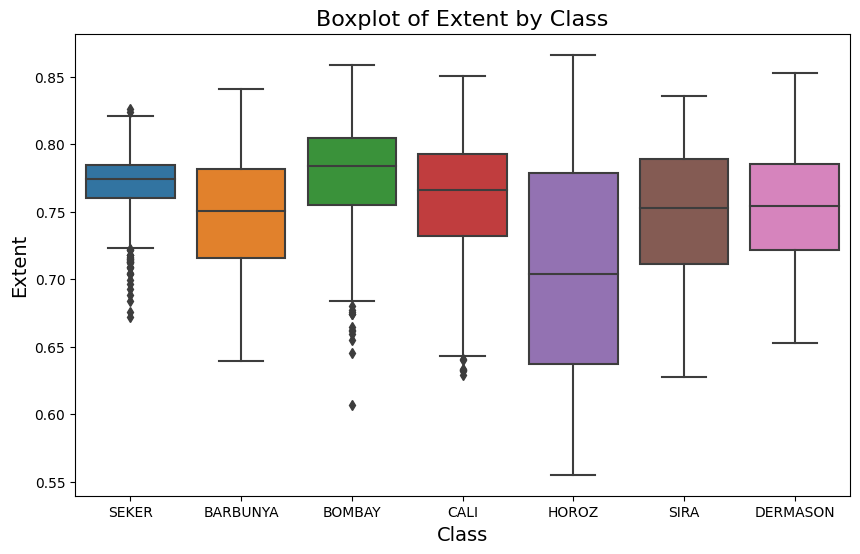

Total number of outliiers in Extent = 50
{'Extent': {'SEKER': 31, 'BARBUNYA': 0, 'BOMBAY': 12, 'CALI': 7, 'HOROZ': 0, 'SIRA': 0, 'DERMASON': 0}}


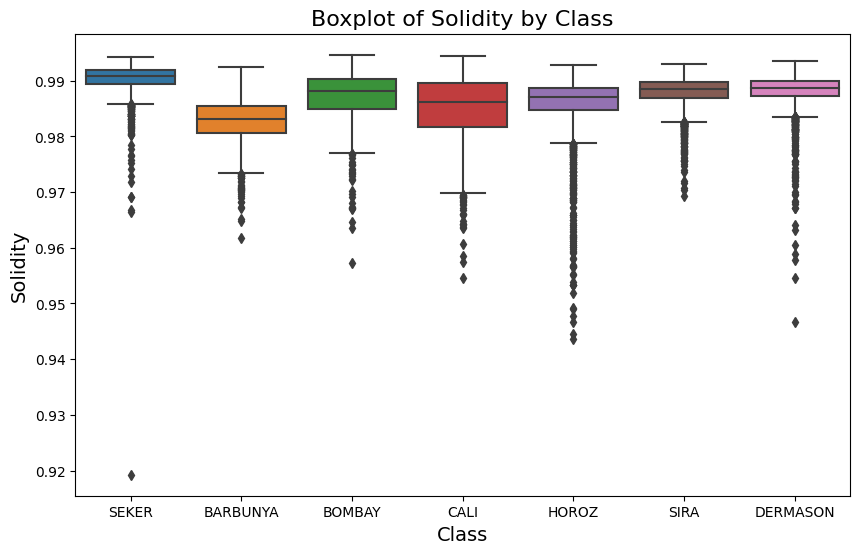

Total number of outliiers in Solidity = 628
{'Solidity': {'SEKER': 90, 'BARBUNYA': 33, 'BOMBAY': 27, 'CALI': 29, 'HOROZ': 170, 'SIRA': 131, 'DERMASON': 148}}


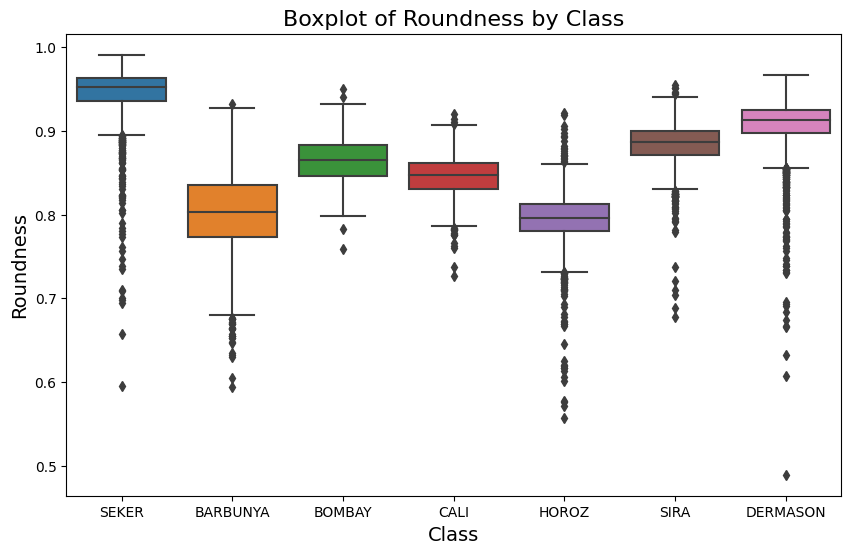

Total number of outliiers in Roundness = 390
{'Roundness': {'SEKER': 97, 'BARBUNYA': 26, 'BOMBAY': 4, 'CALI': 18, 'HOROZ': 72, 'SIRA': 55, 'DERMASON': 118}}


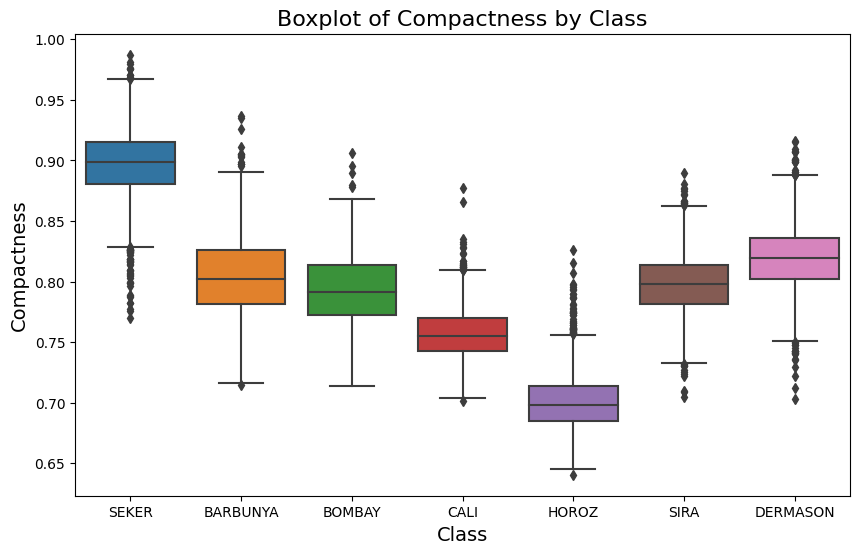

Total number of outliiers in Compactness = 213
{'Compactness': {'SEKER': 54, 'BARBUNYA': 15, 'BOMBAY': 5, 'CALI': 25, 'HOROZ': 50, 'SIRA': 26, 'DERMASON': 38}}


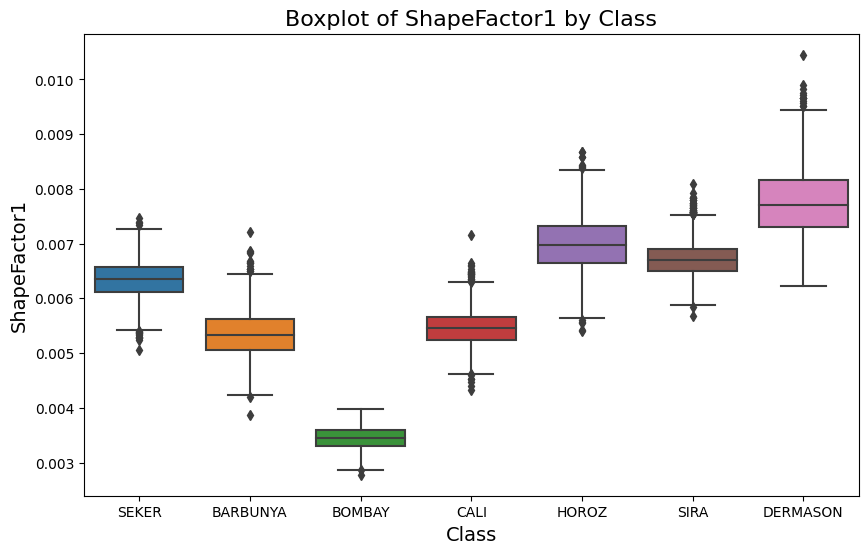

Total number of outliiers in ShapeFactor1 = 134
{'ShapeFactor1': {'SEKER': 17, 'BARBUNYA': 16, 'BOMBAY': 2, 'CALI': 29, 'HOROZ': 13, 'SIRA': 44, 'DERMASON': 13}}


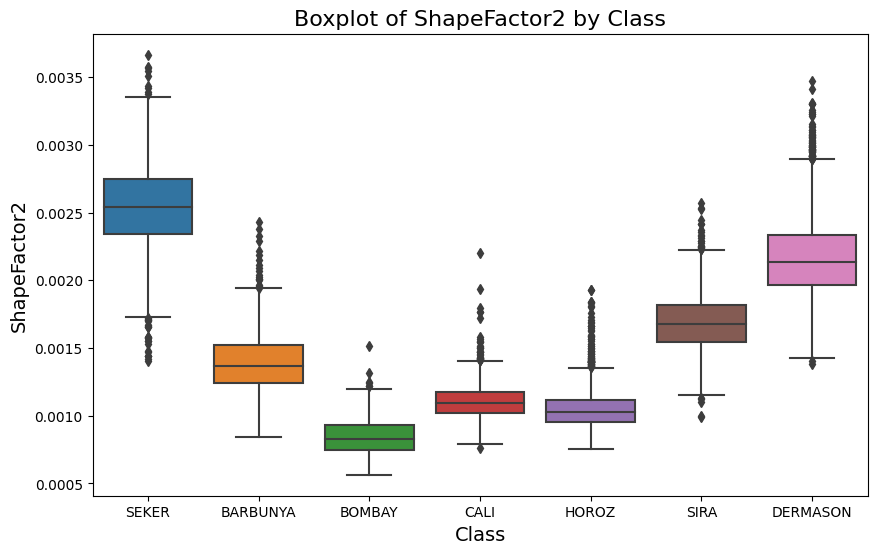

Total number of outliiers in ShapeFactor2 = 248
{'ShapeFactor2': {'SEKER': 32, 'BARBUNYA': 18, 'BOMBAY': 6, 'CALI': 33, 'HOROZ': 73, 'SIRA': 27, 'DERMASON': 59}}


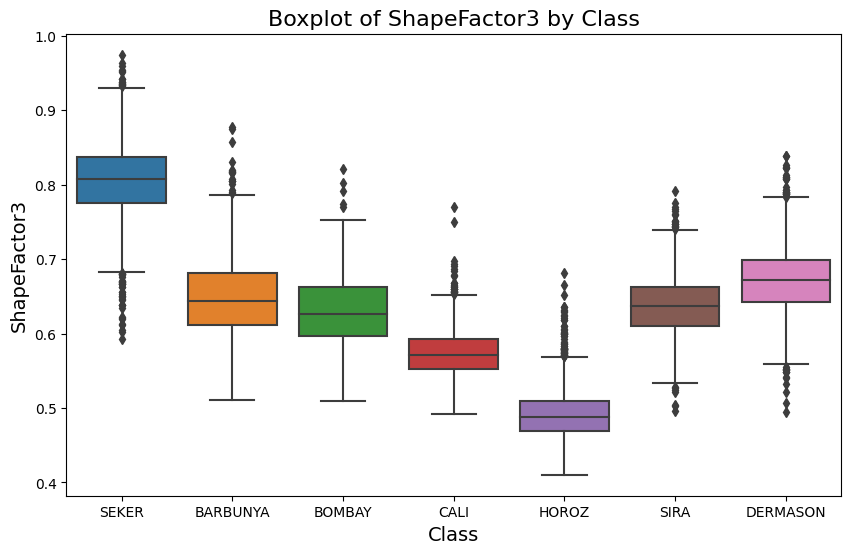

Total number of outliiers in ShapeFactor3 = 219
{'ShapeFactor3': {'SEKER': 52, 'BARBUNYA': 17, 'BOMBAY': 5, 'CALI': 26, 'HOROZ': 55, 'SIRA': 25, 'DERMASON': 39}}


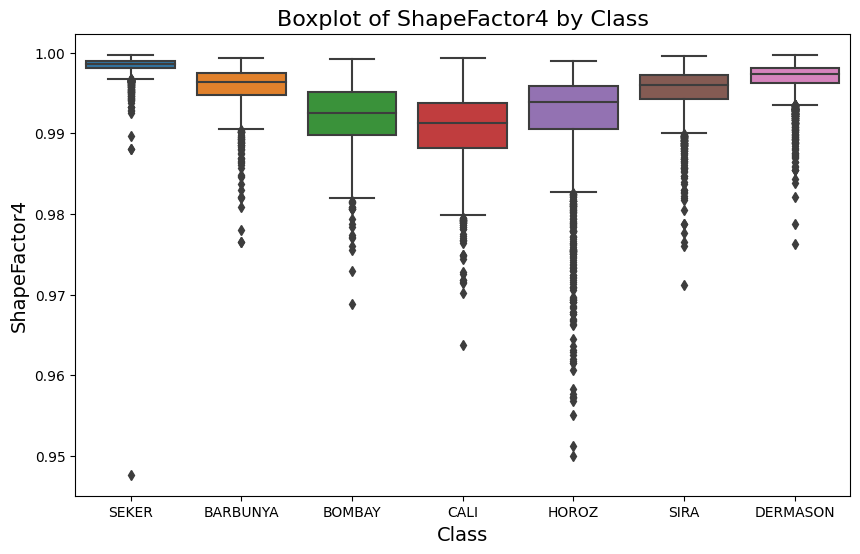

Total number of outliiers in ShapeFactor4 = 642
{'ShapeFactor4': {'SEKER': 98, 'BARBUNYA': 54, 'BOMBAY': 20, 'CALI': 41, 'HOROZ': 144, 'SIRA': 101, 'DERMASON': 184}}


In [ ]:
#This block of code calculates the number of outliers in each column for each class using Interquartile Range (IQR)


for column in numerical_columns:

    outliers_per_class = {}
    classes = dry_beans["Class"].unique()
    outliers_per_class[column] = {}
    total = 0
    for sub_class in classes:

          # Calculate z-score for each data point in the column
          rows_in_sub_class = dry_beans[dry_beans["Class"] == sub_class][column]

          # Calculate the interquartile range (IQR)
          q1 = rows_in_sub_class.quantile(0.25)
          q3 = rows_in_sub_class.quantile(0.75)
          iqr_value = q3 - q1

          # Identify outliers based on the IQR
          lower_bound = q1 - 1.5 * iqr_value
          upper_bound = q3 + 1.5 * iqr_value
          outliers_mask = (rows_in_sub_class < lower_bound) | (rows_in_sub_class > upper_bound)
          outliers = rows_in_sub_class[outliers_mask]

          # Count the number of outliers per class
          num_outliers = outliers.shape[0]
          outliers_per_class[column][sub_class] = num_outliers
          total += num_outliers

    plt.figure(figsize=(10, 6))
    sns.boxplot(x="Class", y=column, data=dry_beans)
    plt.xlabel('Class', fontsize=14)
    plt.ylabel(column, fontsize=14)
    plt.title(f'Boxplot of {column} by Class', fontsize=16)
    plt.show()

    print(f'Total number of outliiers in {column} = {total}')
    print(outliers_per_class)


In [ ]:
#This block of code calculates the number of outliers in each column for each class using z_score

Z_THRESHOLD = 4

for column in numerical_columns:

    outliers_per_class = {}
    classes = dry_beans["Class"].unique()
    outliers_per_class[column] = {}
    total = 0
    for sub_class in classes:

          # Calculate z-score for each data point in the column
          rows_in_sub_class = dry_beans[dry_beans["Class"] == sub_class][column]
          z_scores = zscore(rows_in_sub_class)

          # Identify outliers based on the z-score threshold
          outliers_mask = (abs(z_scores) > Z_THRESHOLD)
          outliers = rows_in_sub_class[outliers_mask]

          # Count the number of outliers per class
          num_outliers = outliers.shape[0]
          outliers_per_class[column][sub_class] = num_outliers
          total += num_outliers

    plt.figure(figsize=(10, 6))
    sns.boxplot(x="Class", y=column, data=dry_beans)
    plt.xlabel('Class', fontsize=14)
    plt.ylabel(column, fontsize=14)
    plt.title(f'Boxplot of {column} by Class', fontsize=16)
    plt.show()

    print(f'Total number of outliiers in {column} = {total}')
    print(outliers_per_class)


After reviewing the aforementioned code, we observed that the total number of outliers in each column doesn't vary significantly. When experimenting with the standard Z_THRESHOLD, set to 3, we found that increasing it to 4 notably reduces the number of outliers. However, it is crucial to acknowledge the $\color{blue}{\text{presence of outliers}}$, and determining the appropriate solution will depend on the models employed.

In [ ]:
# #perform an analysis on the DataFrame

# %%capture
# #captures the stdout/stderr of a cell

# analyze_dry_beans = sweetviz.analyze(source=dry_beans,
#                               pairwise_analysis='auto'#Sweetviz automatically decides whether to perform pairwise comparisons.
#                               )


In [ ]:
#analyze_df.show_notebook()

In [ ]:
# #create instance of pygwalker
# gwalker = pyg.walk(dataset=dry_beans,
#                    use_kernel_calc=True #Specifically, it controls whether to use DuckDB as the computing engine.
#                    )


Now, after fetching the data, we have examined some statistical information to identify potential issues. The approach for addressing these issues depends on the selected model and its robustness for the specific problem. Subsequently, we will convert categorical columns to numerical format and split the data. This initial split is performed before applying any additional preprocessing techniques to prevent data snooping.

In [ ]:
#THIS BLOCK OF CODE PART FROM DATA WRANGLING
#Split the data into training, validation, and test sets to address underfitting and overfitting problems.


# Split the data into training and temporary set (combined validation and test set)
X_train, X_temp, y_train, y_temp = train_test_split(X, y,
                                                    test_size=3611,
                                                    random_state=7,
                                                    stratify=y
                                                    )

# Split the temporary set into validation and test sets
X_validation, X_test, y_validation, y_test = train_test_split(X_temp, y_temp,
                                                              test_size=1500,
                                                              random_state=4,
                                                              stratify=y_temp
                                                              )


# $\color{purple}{\text{DATA PREPROCESSING}}$


In [ ]:
# The library we needed for preprocessing

import numpy as np

from sklearn.preprocessing import PowerTransformer
from sklearn.decomposition import PCA

from imblearn.over_sampling import SMOTE

from sklearn.pipeline import Pipeline


In [ ]:
## After try it we notice that it not improve the accuracy so we will not use it
# Handle imbalance in dry_beans

# # Display the class distribution before oversampling
# print("Class distribution before oversampling:")
# print(y_train.value_counts())

# # Apply SMOTE to oversample the minority class
# smote = SMOTE(random_state=42)
# X_train_resampled, y_train_resampled = smote.fit_resample(X_train, y_train)

# # Display the class distribution after oversampling
# print("\nClass distribution after oversampling:")
# print(y_train_resampled.value_counts())


/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:176: RuntimeWarning: overflow encountered in multiply
  x = um.multiply(x, x, out=x)


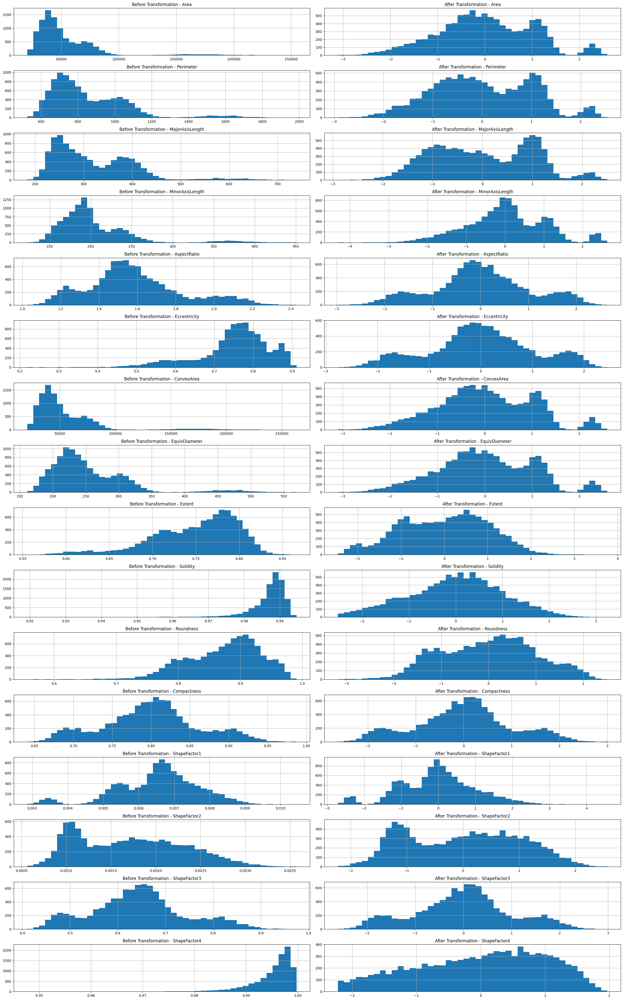

In [ ]:
# Handle Skewness
# Data preprocessing and Data Visualization

def handle_skew_yeojohnson(data: pd.DataFrame):
    # Create a PowerTransformer with Yeo-Johnson method
    power_transformer = PowerTransformer(method='yeo-johnson', standardize=True)

    # Create the pipeline
    skew_pipeline = Pipeline([
        ('yeo_johnson', power_transformer)
    ])

    # Fit and transform the data using the pipeline
    X_train_transformed = skew_pipeline.fit_transform(data)
    data_transformed = pd.DataFrame(X_train_transformed, columns=data.columns)

    return skew_pipeline, data_transformed

def plot_histograms(data_before, data_after):

    num_rows = len(data_before.columns)
    fig, axes = plt.subplots(nrows=num_rows, ncols=2, figsize=(25, 40))
    num_bins = 45
    for i, col in enumerate(data_before.columns):
        data_before[col].hist(bins=num_bins,
                              ax=axes[i, 0]
                               )
        axes[i, 0].set_title(f'Before Transformation - {col}')

        data_after[col].hist(bins=num_bins,
                             ax=axes[i, 1]
                              )

        axes[i, 1].set_title(f'After Transformation - {col}')

    plt.tight_layout()
    plt.show()

skew_pipeline, X_train_transformed = handle_skew_yeojohnson(data=X_train)

# Plot histograms before and after transformation
plot_histograms(X_train, X_train_transformed)


In [ ]:
X_train = X_train_transformed

We can observe that the distribution of the data has clearly become different and more symmetric.
And with standardized=True, the scaling type used is standardization. The Yeo-Johnson transformation is applied first to handle skewness, and then the standardized version of the transformed data is obtained.

In [ ]:
def Transforming_and_Scalling(data: pd.DataFrame) -> pd.DataFrame:

     """
     This function will apply transforiming using Yeo-Johnson method,
     and a standardization the data. Then return the df
     """

     transformed_data = skew_pipeline.transform(data)
     transformed_df = pd.DataFrame(transformed_data, columns=data.columns)

     return  transformed_df


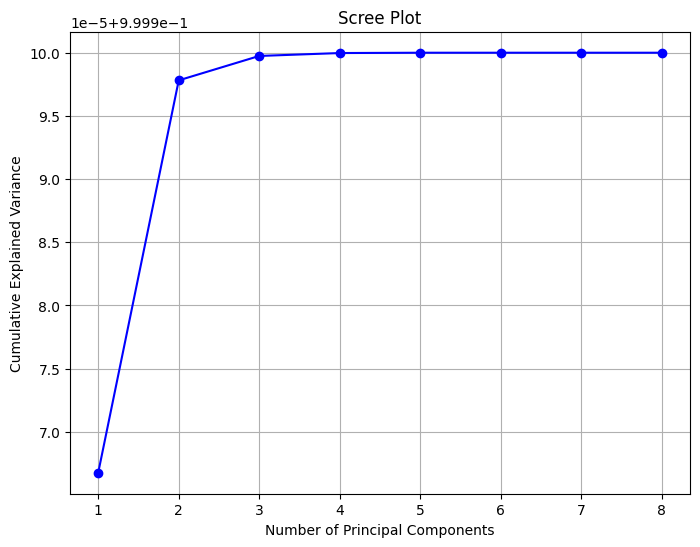

In [ ]:
sub_features = X_train[['Area', 'Perimeter', 'MajorAxisLength', 'MinorAxisLength',
       'AspectRatio', 'Eccentricity', 'ConvexArea', 'EquivDiameter']]

# Apply PCA to obtain the explained variance
pca = PCA()
X_pca = pca.fit_transform(sub_features)

# Get the explained variance ratios
explained_variance_ratio = pca.explained_variance_ratio_
cumulative_explained_variance = np.cumsum(explained_variance_ratio)

# x_range
num_features =  sub_features.shape[1]
x_range = np.arange(1, num_features+1)
# Plot the scree plot
# Scree plot helps us determine the appropriate number of principal components (PCs).

plt.figure(figsize=(8, 6))
plt.plot(x_range, cumulative_explained_variance, marker='o', linestyle='-', color='b')
plt.title('Scree Plot')
plt.xlabel('Number of Principal Components')
plt.ylabel('Cumulative Explained Variance')
plt.grid(True)
plt.show()


From the above code, it appears that when the number of principal components (PCA) is set to 3, it provides the best explanation of variance, reaching 100%.

In [ ]:
# Define the columns to be processed by PCA
COLUMNS_TO_PCA = X_train[['Area', 'Perimeter', 'MajorAxisLength', 'MinorAxisLength',
                  'AspectRatio', 'Eccentricity', 'ConvexArea', 'EquivDiameter']]

# Create a pipeline
pca_pipeline = Pipeline([
    ('pca', PCA(n_components=3)), # Set the desired number of components
    ])

# Fit and transform the data using the pipeline
pca_data = pca_pipeline.fit_transform(COLUMNS_TO_PCA)

# Create a DataFrame with the new PCA columns
pca_df = pd.DataFrame(data=pca_data,
                      columns=[f'PC_{i}' for i in range(1, pca_data.shape[1] + 1)])

pca_df

,PC_1,PC_2,PC_3
0,-3507.219855,-142.800602,17.373305
1,-8688.964759,114.061770,-40.437276
2,-21956.631974,-64.514169,26.212322
3,-30713.595092,-20.073107,47.288781
4,-26605.065493,-18.552104,40.754314
...,...,...,...
9995,-14038.455985,-30.194180,13.781567
9996,-6921.203736,-46.077061,17.559496
9997,-24165.311503,-93.099629,35.951173
9998,6680.560118,-198.105087,-104.141915


In [ ]:
def pca(data_set: pd.DataFrame) -> pd.DataFrame:

    """
    This function applies PCA to the provided dataset,
    excluding the original columns that were transformed into PCA components.
    Subsequently, it concatenates the dataset with the PCA columns.
    """

    COLUMNS_TO_PCA = data_set[['Area', 'Perimeter', 'MajorAxisLength', 'MinorAxisLength',
                  'AspectRatio', 'Eccentricity', 'ConvexArea', 'EquivDiameter']]
    # Transform the data using the pipeline
    pca_data = pca_pipeline.transform(COLUMNS_TO_PCA)

    # Excluding the original columns
    data_set.drop(labels=COLUMNS_TO_PCA,
                  axis=1,
                  inplace=True
                  )

    df_with_pca = pd.DataFrame(pca_data, columns=['PCA1', 'PCA2', 'PCA3'])
    # Reset index to ensure proper concatenation
    data_set.reset_index(drop=True, inplace=True)
    data_set = pd.concat(objs=[df_with_pca, data_set],
                   axis=1
                   )

    return data_set


In [ ]:
X_train = pca(X_train)

# $\color{purple}{\text{PIPELINE}}$

In [ ]:
def pipeline(data: pd.DataFrame) -> pd.DataFrame:
  """
  This function apply the full preprocessing steps
  on the provided data and return dataframe.
  """

  data_transformed = Transforming_and_Scalling(data=data)
  data_with_pc = pca(data_set=data_transformed)

  return data_with_pc

# $\color{purple}{\text{MODEL BUILDING}}$

In [ ]:
# Import necessary libraries for model building and testing

from sklearn.ensemble import RandomForestClassifier
from sklearn.svm import SVC
from sklearn.neighbors import KNeighborsClassifier

from sklearn.metrics import accuracy_score, classification_report, f1_score, confusion_matrix


In [ ]:
MODELS_DICT = {
    'svm': {"MODEL_NAME": SVC,
            "MODEL_PARAMS": {'probability': True, 'C': 1.0, 'kernel': 'rbf', 'gamma': 'scale'}
            },

    'rfc': {"MODEL_NAME": RandomForestClassifier,
            "MODEL_PARAMS": {'random_state': 42, 'n_estimators': 100, 'max_depth': None}
            },

    'knn': {"MODEL_NAME": KNeighborsClassifier,
            "MODEL_PARAMS": {'n_neighbors': 9, 'algorithm': 'ball_tree'}
            }
}


In [ ]:
def train_model(model_name, model_params: dict , X_true):
    """
    This function will take the model name, model_params and X_true as an argument
    and train the model and return y_pred
    """


    # Initialize the model
    model = model_name(**model_params)

    model.fit(X_train, y_train)

    # Make predictions on the test set
    y_pred = model.predict(X_true)
    model_probs = model.predict_proba(X_true)


    return y_pred, model, model_probs


# $\color{purple}{\text{PERFORMANCE EVALUATION}}$

In [ ]:
def validate_or_test_model(model_name, model_params, X_true):
    """
    This function use for model_validation or model_testing,
     and it will take the model name and y_true,
    then call train_model function, and compute the following:
    classificatio_report, Accuarcy, F1_score, confusion_matrix.
    """

    y_true = y_validation if X_true.equals(X_validation) else y_test

    # Train the model
    y_pred, model, model_probs = train_model(model_name=model_name,
                         model_params=model_params,
                         X_true=X_true)

    # Evaluate the model
    accuracy = accuracy_score(y_true, y_pred)
    f1 = f1_score(y_true, y_pred, average="weighted")
    print(model_name)
    print(f'Accuracy: {accuracy:.2f}')
    print(f"f1 Score: {f1}")

    print('\nClassification Report:\n', classification_report(y_true, y_pred))

    cm = confusion_matrix(y_true, y_pred)

    custom_cmap = sns.color_palette("Set3", n_colors=7)

    sns.heatmap(cm, annot=True, fmt="d", cmap=custom_cmap, cbar=False,
                xticklabels=model.classes_, yticklabels=model.classes_)

    plt.xlabel("Predicted Label")
    plt.ylabel("True Label")
    plt.title("Confusion Matrix")
    plt.show()

In [ ]:
X_validation = Transforming_and_Scalling(data=X_validation)
X_validation = pca(X_validation)

/usr/local/lib/python3.10/dist-packages/sklearn/utils/validation.py:1143: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


<class 'sklearn.svm._classes.SVC'>
Accuracy: 0.26
f1 Score: 0.10770162768312792

Classification Report:
               precision    recall  f1-score   support

    BARBUNYA       0.00      0.00      0.00       205
      BOMBAY       0.00      0.00      0.00        81
        CALI       0.00      0.00      0.00       253
    DERMASON       0.26      1.00      0.41       550
       HOROZ       0.00      0.00      0.00       299
       SEKER       0.00      0.00      0.00       314
        SIRA       0.00      0.00      0.00       409

    accuracy                           0.26      2111
   macro avg       0.04      0.14      0.06      2111
weighted avg       0.07      0.26      0.11      2111



/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


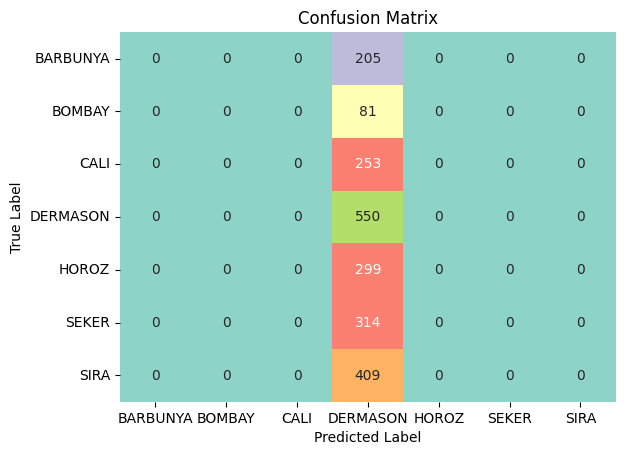

<ipython-input-36-50897c653a27>:12: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  model.fit(X_train, y_train)


<class 'sklearn.ensemble._forest.RandomForestClassifier'>
Accuracy: 0.49
f1 Score: 0.41783779929933496

Classification Report:
               precision    recall  f1-score   support

    BARBUNYA       0.00      0.00      0.00       205
      BOMBAY       0.11      0.94      0.20        81
        CALI       0.00      0.00      0.00       253
    DERMASON       0.60      0.97      0.74       550
       HOROZ       0.69      0.54      0.61       299
       SEKER       0.89      0.88      0.88       314
        SIRA       0.00      0.00      0.00       409

    accuracy                           0.49      2111
   macro avg       0.33      0.47      0.35      2111
weighted avg       0.39      0.49      0.42      2111



/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


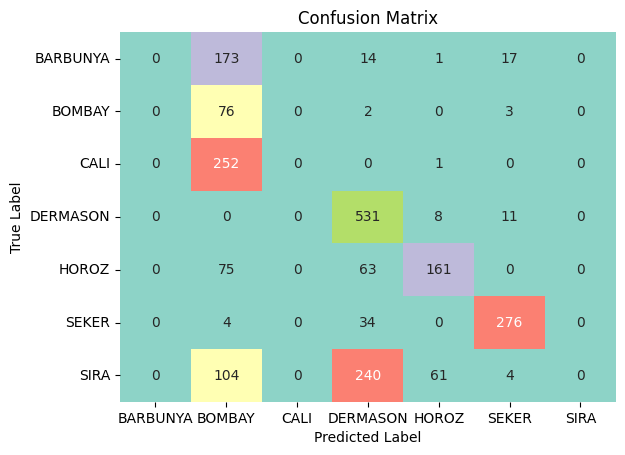

/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:215: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)


<class 'sklearn.neighbors._classification.KNeighborsClassifier'>
Accuracy: 0.26
f1 Score: 0.10770162768312792

Classification Report:
               precision    recall  f1-score   support

    BARBUNYA       0.00      0.00      0.00       205
      BOMBAY       0.00      0.00      0.00        81
        CALI       0.00      0.00      0.00       253
    DERMASON       0.26      1.00      0.41       550
       HOROZ       0.00      0.00      0.00       299
       SEKER       0.00      0.00      0.00       314
        SIRA       0.00      0.00      0.00       409

    accuracy                           0.26      2111
   macro avg       0.04      0.14      0.06      2111
weighted avg       0.07      0.26      0.11      2111



/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


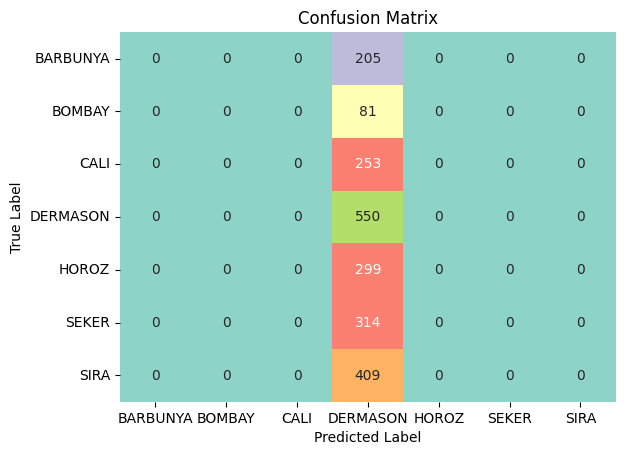

In [ ]:
for model in MODELS_DICT:
    validate_or_test_model(model_name=MODELS_DICT[model]["MODEL_NAME"],
                          model_params=MODELS_DICT[model]["MODEL_PARAMS"],
                          X_true=X_validation)

In [ ]:
X_test = pipeline

/usr/local/lib/python3.10/dist-packages/sklearn/utils/validation.py:1143: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


Accuracy: 0.94
f1 Score: 0.9372727925827935

Classification Report:
               precision    recall  f1-score   support

    BARBUNYA       0.96      0.92      0.94       146
      BOMBAY       1.00      1.00      1.00        57
        CALI       0.94      0.96      0.95       179
    DERMASON       0.93      0.92      0.93       391
       HOROZ       0.96      0.96      0.96       213
       SEKER       0.94      0.97      0.95       224
        SIRA       0.90      0.90      0.90       290

    accuracy                           0.94      1500
   macro avg       0.95      0.95      0.95      1500
weighted avg       0.94      0.94      0.94      1500



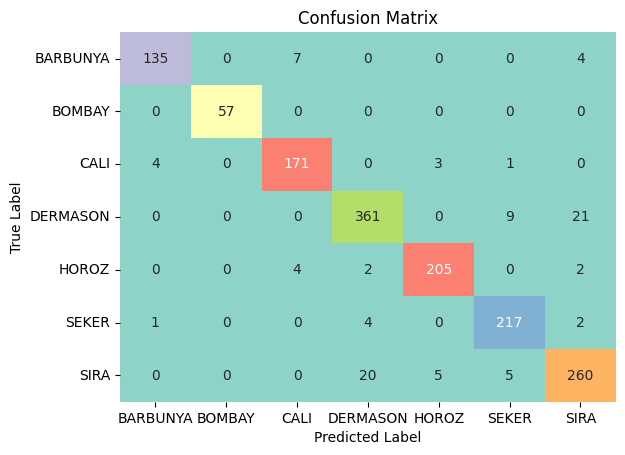

<ipython-input-26-eab4f462ccfe>:12: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  model.fit(X_train, y_train)


Accuracy: 0.93
f1 Score: 0.9319585012740721

Classification Report:
               precision    recall  f1-score   support

    BARBUNYA       0.92      0.94      0.93       146
      BOMBAY       1.00      1.00      1.00        57
        CALI       0.94      0.92      0.93       179
    DERMASON       0.93      0.91      0.92       391
       HOROZ       0.96      0.95      0.96       213
       SEKER       0.94      0.97      0.96       224
        SIRA       0.89      0.90      0.90       290

    accuracy                           0.93      1500
   macro avg       0.94      0.94      0.94      1500
weighted avg       0.93      0.93      0.93      1500



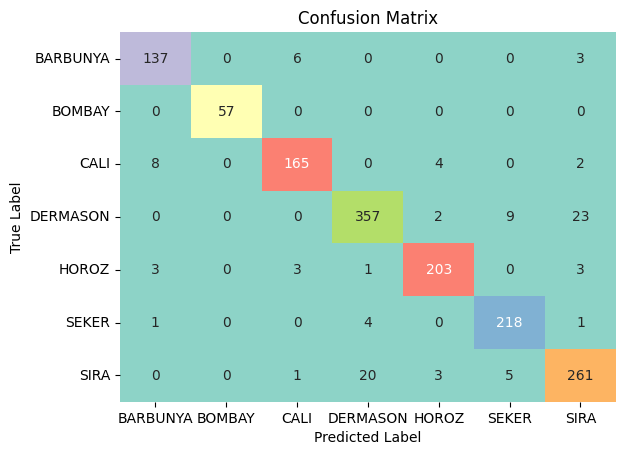

/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:215: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)


Accuracy: 0.93
f1 Score: 0.9279947784373767

Classification Report:
               precision    recall  f1-score   support

    BARBUNYA       0.94      0.90      0.92       146
      BOMBAY       1.00      1.00      1.00        57
        CALI       0.93      0.95      0.94       179
    DERMASON       0.93      0.91      0.92       391
       HOROZ       0.96      0.96      0.96       213
       SEKER       0.94      0.96      0.95       224
        SIRA       0.87      0.89      0.88       290

    accuracy                           0.93      1500
   macro avg       0.94      0.94      0.94      1500
weighted avg       0.93      0.93      0.93      1500



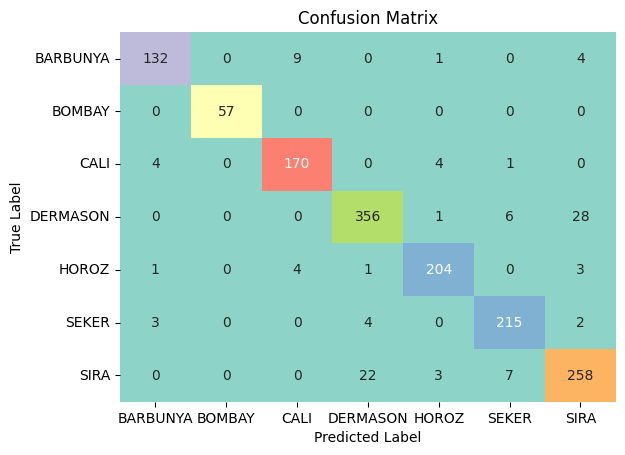

In [ ]:
for model in MODELS_DICT:
      validate_or_test_model(model_name=MODELS_DICT[model]["MODEL_NAME"],
                       model_params=MODELS_DICT[model]["MODEL_PARAMS"],
                       X_true=X_test)

# $\color{purple}{\text{MODEL OPTIMIZATION}}$

In [ ]:
from skopt import BayesSearchCV

# Define the hyperparameter search space
param_space = {
    'C': (1, 25),
    'kernel': ['linear', 'poly', 'rbf', 'sigmoid'],
    'degree': (1, 8),  # Only used by the 'poly' kernel
}

model = SVC()

# Perform Bayesian optimization for hyperparameter tuning
opt = BayesSearchCV(
    model,
    param_space,
    n_iter=50,  # Number of optimization steps
    cv=5,  # Number of cross-validation folds
    n_jobs=-1,  # Use all available CPU cores
    random_state=42,
)

opt.fit(X_train, y_train)

# Print the best hyperparameters found by Bayesian optimization
print("Best Hyperparameters:", opt.best_params_)

# Evaluate the model with the best hyperparameters on the test set
best_model = opt.best_estimator_
y_pred = best_model.predict(X_test)


/usr/local/lib/python3.10/dist-packages/skopt/optimizer/optimizer.py:449: UserWarning: The objective has been evaluated at this point before.
  warnings.warn("The objective has been evaluated "
/usr/local/lib/python3.10/dist-packages/skopt/optimizer/optimizer.py:449: UserWarning: The objective has been evaluated at this point before.
  warnings.warn("The objective has been evaluated "
/usr/local/lib/python3.10/dist-packages/skopt/optimizer/optimizer.py:449: UserWarning: The objective has been evaluated at this point before.
  warnings.warn("The objective has been evaluated "
/usr/local/lib/python3.10/dist-packages/skopt/optimizer/optimizer.py:449: UserWarning: The objective has been evaluated at this point before.
  warnings.warn("The objective has been evaluated "
/usr/local/lib/python3.10/dist-packages/sklearn/utils/validation.py:1143: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using rav

Best Hyperparameters: OrderedDict([('C', 10), ('degree', 8), ('kernel', 'rbf')])


In [ ]:
def optimization(model_name, param_space: dict ={}):
    """
    This function take the specified model and model params space,
    and fit the optimizer on the training data and return the best Hyperparameters.
    """

    model = model_name()

    opt = BayesSearchCV(
    model,
    param_space,
    n_iter=50,  # Number of optimization steps
    cv=5,  # Number of cross-validation folds
    n_jobs=-1,  # Use all available CPU cores
    random_state=42,
    )

    # Fit the optimizer on the training data
    opt.fit(X_train, y_train)

    Best_Hyperparameters = opt.best_params_

    return Best_Hyperparameters


/usr/local/lib/python3.10/dist-packages/sklearn/utils/validation.py:1143: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


Accuracy: 0.93
f1 Score: 0.9328722896690074

Classification Report:
               precision    recall  f1-score   support

    BARBUNYA       0.94      0.97      0.95       146
      BOMBAY       1.00      1.00      1.00        57
        CALI       0.96      0.96      0.96       179
    DERMASON       0.90      0.94      0.92       391
       HOROZ       0.99      0.95      0.97       213
       SEKER       0.98      0.92      0.95       224
        SIRA       0.88      0.88      0.88       290

    accuracy                           0.93      1500
   macro avg       0.95      0.94      0.95      1500
weighted avg       0.93      0.93      0.93      1500



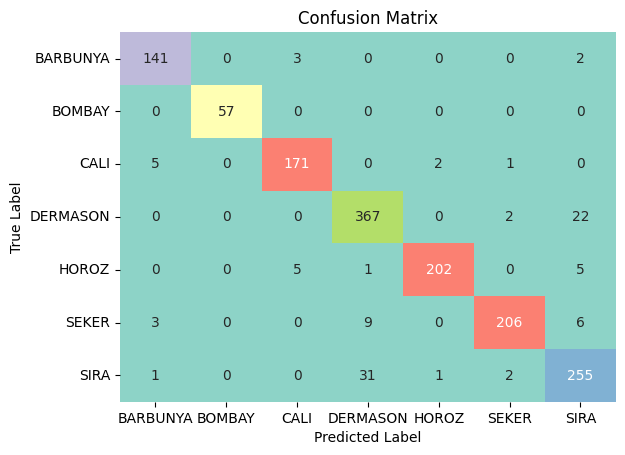

In [ ]:
# Finally, prepare the model for the production environment. Typically, we would train on the entire dataset with this command:
# model.fit(X, y)
# However, for insight into the model's generalization, we'll use our training and validation sets as a representative subset.

#best params from optimization is this set
#{'C': 10, 'kernel': 'rbf', 'gamma': 'scale'}
#but we will not use since not improve the performance

X = pd.concat(objs=[X_train, X_validation],
              axis=0
              )

y = pd.concat(objs=[y_train, y_validation],
              axis=0
              )
# In this step the data already prepare and we don't need this command:
# X = pipeline(X)

#best_params
model_params = {'C': 1.0, 'kernel': 'rbf', 'gamma': 'scale'}
model = SVC(**model_params)
model.fit(X, y)
y_pred = model.predict(X_test)

accuracy = accuracy_score(y_test, y_pred)
f1 = f1_score(y_test, y_pred, average="weighted")

print(f'Accuracy: {accuracy:.2f}')
print(f"f1 Score: {f1}")

print('\nClassification Report:\n', classification_report(y_test, y_pred))

cm = confusion_matrix(y_test, y_pred)

# Define a custom colormap with 7 colors to represent each class
custom_cmap = sns.color_palette("Set3", n_colors=7)

sns.heatmap(cm, annot=True, fmt="d", cmap=custom_cmap, cbar=False,
            xticklabels=model.classes_, yticklabels=model.classes_)

plt.xlabel("Predicted Label")
plt.ylabel("True Label")
plt.title("Confusion Matrix")
plt.show()


In [ ]:
# dump the model
model_filename = 'SVM.joblib'

joblib.dump(value=model,
            filename=model_filename)

['SVM.joblib']